# Actual Thing

## Load Data

In [1]:
import os, torch, csv

dataset_path = r'Cut'
csv_path = r'Captions.csv'

In [2]:
def load_text_descriptions_from_csv(csv_file):
    text_descriptions = {}
    with open(csv_file, newline='', encoding='utf-8') as f:
        reader = csv.DictReader(f)
        for row in reader:
            filename = row['Filename']
            description = row['Description']
            text_descriptions[filename] = description
    return text_descriptions

text_descriptions = load_text_descriptions_from_csv(csv_path)

## Visualize Data

Class: R25 (Very Dark), Count: 417
Class: R35 (Dark), Count: 409
Class: R45 (Moderately Dark), Count: 388
Class: R55 (Medium), Count: 373
Class: R65 (Medium Light), Count: 392
Class: R75 (Light), Count: 400
Class: R85 (Very Light), Count: 400
Class: R95 (Extremely Light), Count: 401


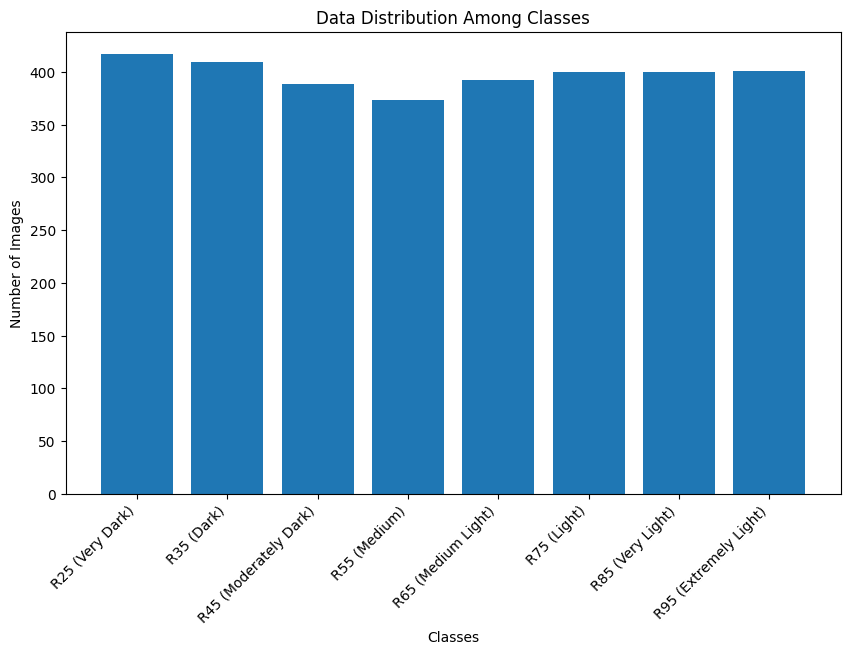

In [3]:
import matplotlib.pyplot as plt

# Get the class names (subfolder names)
class_names = sorted(os.listdir(dataset_path))

# Initialize a dictionary to store class distribution
class_distribution = {}

# Loop over each class folder
for class_name in class_names:
    class_folder = os.path.join(dataset_path, class_name)
    # Count the number of files (images) in each folder
    num_files = len(os.listdir(class_folder))
    class_distribution[class_name] = num_files

# Print the class distribution
for class_name, count in class_distribution.items():
    print(f'Class: {class_name}, Count: {count}')

# Plot the distribution as a bar chart
plt.figure(figsize=(10, 6))
plt.bar(class_distribution.keys(), class_distribution.values())
plt.xticks(rotation=45, ha='right')
plt.title('Data Distribution Among Classes')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.show()

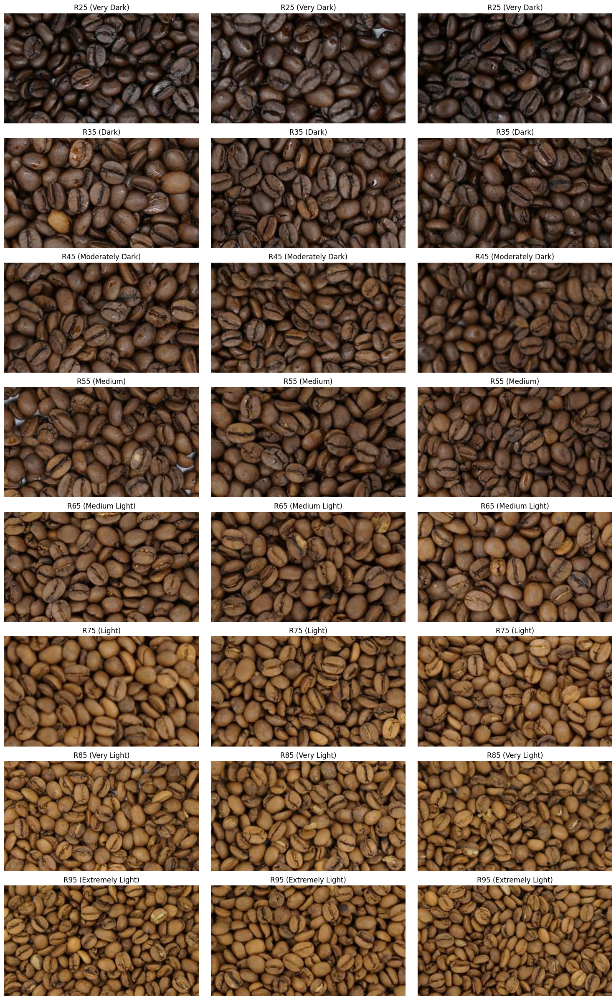

In [4]:
import random
from PIL import Image

# Get the class names (subfolder names)
class_names = sorted(os.listdir(dataset_path))

# Set the number of samples you want to display per class
num_samples_per_class = 3

# Initialize a figure
plt.figure(figsize=(15, len(class_names) * 3))

# Loop over each class folder and display image samples
for i, class_name in enumerate(class_names):
    class_folder = os.path.join(dataset_path, class_name)
    # Get a list of all image files in the class folder
    image_files = os.listdir(class_folder)
    
    # Randomly select a few images from the class folder
    sample_images = random.sample(image_files, num_samples_per_class)
    
    # Loop through the selected images
    for j, image_file in enumerate(sample_images):
        # Load the image
        img_path = os.path.join(class_folder, image_file)
        img = Image.open(img_path)
        
        # Plot the image
        plt.subplot(len(class_names), num_samples_per_class, i * num_samples_per_class + j + 1)
        plt.imshow(img)
        plt.title(f'{class_name}')
        plt.axis('off')

# Show the plot
plt.tight_layout()
plt.show()

In [5]:
import pandas as pd

csvfile = pd.read_csv(csv_path)
print(csvfile.head())

       Filename                                        Description
0  DSC09527.JPG  The darkest roast, with a deep, smoky flavor a...
1  DSC09528.JPG  The darkest roast, with a deep, smoky flavor a...
2  DSC09529.JPG  The darkest roast, with a deep, smoky flavor a...
3  DSC09530.JPG  The darkest roast, with a deep, smoky flavor a...
4  DSC09531.JPG  The darkest roast, with a deep, smoky flavor a...


## Preprocessing

### Image Preprocessing

In [6]:
from torchvision import transforms
import torchvision.transforms.functional as F
from PIL import ImageFilter


# Custom transform to include Equalization
class EqualizeTransform:
    def __call__(self, img):
        return F.equalize(img)
    
# Custom function to apply sharpening
def sharpen_image(image):
    return image.filter(ImageFilter.SHARPEN)

# Define the preprocessing pipeline
preprocessed_images = transforms.Compose([
    transforms.RandomResizedCrop((224, 224)),
    transforms.Lambda(lambda img: sharpen_image(img)),
    transforms.ColorJitter(
        #brightness=0.4, 
        contrast=0.4, 
        saturation=0.4, 
    #    hue=0.2  # Adjust color variations
    ),
    #EqualizeTransform(),  # Apply equalization
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    #transforms.ToPILImage(),
])

images_to_display = transforms.Compose([
    transforms.RandomResizedCrop((224, 224)),
    transforms.Lambda(lambda img: sharpen_image(img)),
    transforms.ColorJitter(
        #brightness=0.4, 
        contrast=0.4, 
        saturation=0.4, 
    #    hue=0.2  # Adjust color variations
    ),
    #EqualizeTransform(),  # Apply equalization
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.ToPILImage(),
])

no_preprocessing = transforms.Compose([
    transforms.RandomResizedCrop((224, 224)),
    transforms.ToTensor(),
])


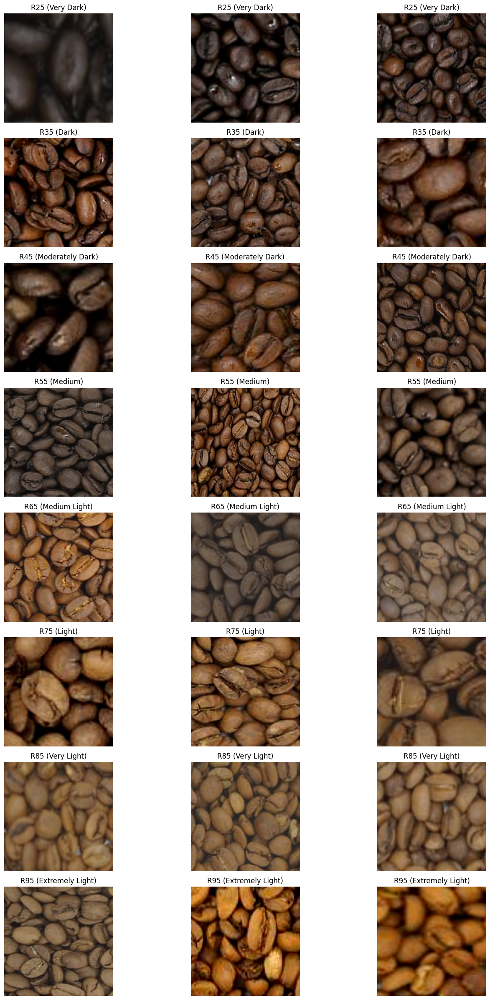

In [7]:
import random
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms

# Get the class names (subfolder names)
class_names = sorted(os.listdir(dataset_path))

# Set the number of samples you want to display per class
num_samples_per_class = 3

# Initialize a figure
plt.figure(figsize=(15, len(class_names) * 3))

# Loop over each class folder and display image samples
for i, class_name in enumerate(class_names):
    class_folder = os.path.join(dataset_path, class_name)
    # Get a list of all image files in the class folder
    image_files = os.listdir(class_folder)
    
    # Randomly select a few images from the class folder
    sample_images = random.sample(image_files, num_samples_per_class)
    
    # Loop through the selected images
    for j, image_file in enumerate(sample_images):
        # Load the image
        img_path = os.path.join(class_folder, image_file)
        img = Image.open(img_path)
        
        # Apply preprocessing
        preprocessed_img = images_to_display(img)
        
        # Plot the preprocessed image
        plt.subplot(len(class_names), num_samples_per_class, i * num_samples_per_class + j + 1)
        plt.imshow(preprocessed_img)
        plt.title(f'{class_name}')
        plt.axis('off')

# Show the plot
plt.tight_layout()
plt.show()


## ViT

### DataLoader

In [8]:
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import ImageFolder

# Load the dataset with no subset limit
dataset = ImageFolder(root='Histogram Matched', transform=no_preprocessing)

# Split the dataset into training, validation, and test sets (80%, 10%, 10%)
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)


### Create Model

#### Initialize ViT Model

In [9]:
## Import Vision Transformer from torchvision
from torchvision.models.vision_transformer import vit_b_16, vit_b_32
import torch.nn as nn
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize Vision Transformer from scratch
vit_model = vit_b_32(weights=False)  

# Modify the classifier head for 8 classes (coffee bean roast levels)
vit_model.heads = nn.Linear(vit_model.heads.head.in_features, 8)

# Move the model to GPU (if available)
vit_model.to(device)

c:\Users\DHAFINDRA\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate=none)
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_att

#### Define Loss and Optimizer

In [10]:
# For ViT
import torch.optim as optim

## Define Loss and Optimizer
criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(vit_model.parameters(), lr=1e-4, weight_decay=0.01)



### Training

In [ ]:
import time  # to measure time per epoch
from tqdm import tqdm

num_epochs = 250
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    vit_model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    start_time = time.time()  # Record start time for each epoch

    with tqdm(total=len(train_loader), desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch') as pbar:
        for batch_idx, (inputs, labels) in enumerate(train_loader):
            inputs, labels = inputs.to(device), labels.long().to(device)

            optimizer.zero_grad()

            # Forward pass
            outputs = vit_model(inputs)
            loss = criterion(outputs, labels)

            # Backward pass and optimization
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Track accuracy for training set
            _, predicted_train = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted_train == labels).sum().item()

            # Custom metrics to display in tqdm bar
            current_loss = loss.item()
            avg_loss = running_loss / (batch_idx + 1)  # Running average loss

            # Update tqdm bar with custom metrics
            pbar.set_postfix({
                'Batch Loss': current_loss, 
                'Avg Loss': avg_loss, 
                'LR': optimizer.param_groups[0]['lr']  # Display current learning rate
            })
            pbar.update(1)

    # Record the epoch loss and accuracy for training
    avg_epoch_loss = running_loss / len(train_loader)
    train_losses.append(avg_epoch_loss)
    train_accuracy = 100 * correct_train / total_train
    train_accuracies.append(train_accuracy)

    # Validation after each epoch
    vit_model.eval()
    correct_val = 0
    total_val = 0
    running_val_loss = 0.0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = vit_model(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()

            _, predicted_val = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted_val == labels).sum().item()

    avg_val_loss = running_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    val_accuracy = 100 * correct_val / total_val
    val_accuracies.append(val_accuracy)

    # Calculate and display epoch duration
    epoch_duration = time.time() - start_time
    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {avg_epoch_loss}, Train Acc: {train_accuracy}%, Val Loss: {avg_val_loss}, Val Acc: {val_accuracy}%, Time: {epoch_duration:.2f}s')


Epoch 1/100: 100%|██████████| 157/157 [00:44<00:00,  3.51batch/s, Batch Loss=1.19, Avg Loss=1.94, LR=0.0001] 


Epoch 1/100, Train Loss: 1.936212413250261, Train Acc: 24.173636001592993%, Val Loss: 1.8368028342723846, Val Acc: 22.364217252396166%, Time: 46.50s


Epoch 2/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.935, Avg Loss=1.05, LR=0.0001]


Epoch 2/100, Train Loss: 1.0464211504930143, Train Acc: 50.53763440860215%, Val Loss: 0.8600476980209351, Val Acc: 52.3961661341853%, Time: 37.38s


Epoch 3/100: 100%|██████████| 157/157 [00:35<00:00,  4.38batch/s, Batch Loss=1.22, Avg Loss=0.888, LR=0.0001] 


Epoch 3/100, Train Loss: 0.8879620831483489, Train Acc: 59.06013540422143%, Val Loss: 1.0564460635185242, Val Acc: 58.146964856230035%, Time: 37.22s


Epoch 4/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.656, Avg Loss=0.624, LR=0.0001]


Epoch 4/100, Train Loss: 0.624386823860703, Train Acc: 70.60931899641577%, Val Loss: 0.5204459503293037, Val Acc: 70.92651757188499%, Time: 37.51s


Epoch 5/100: 100%|██████████| 157/157 [00:36<00:00,  4.33batch/s, Batch Loss=0.2, Avg Loss=0.411, LR=0.0001]   


Epoch 5/100, Train Loss: 0.4107115988613694, Train Acc: 80.40621266427718%, Val Loss: 0.1847547383978963, Val Acc: 95.2076677316294%, Time: 37.73s


Epoch 6/100: 100%|██████████| 157/157 [00:36<00:00,  4.33batch/s, Batch Loss=0.179, Avg Loss=0.452, LR=0.0001] 


Epoch 6/100, Train Loss: 0.4520988172738795, Train Acc: 80.16726403823178%, Val Loss: 0.25082932896912097, Val Acc: 85.62300319488818%, Time: 37.67s


Epoch 7/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.179, Avg Loss=0.427, LR=0.0001]


Epoch 7/100, Train Loss: 0.4268182499725727, Train Acc: 82.59657506969334%, Val Loss: 0.2054103549569845, Val Acc: 91.05431309904154%, Time: 37.33s


Epoch 8/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.362, Avg Loss=0.221, LR=0.0001] 


Epoch 8/100, Train Loss: 0.2208252375838673, Train Acc: 89.76503385105535%, Val Loss: 0.5590739615261555, Val Acc: 77.95527156549521%, Time: 37.49s


Epoch 9/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.178, Avg Loss=0.383, LR=0.0001] 


Epoch 9/100, Train Loss: 0.3828875954458668, Train Acc: 81.83990442054959%, Val Loss: 0.18084985613822938, Val Acc: 88.49840255591054%, Time: 37.40s


Epoch 10/100: 100%|██████████| 157/157 [00:35<00:00,  4.39batch/s, Batch Loss=0.183, Avg Loss=0.369, LR=0.0001] 


Epoch 10/100, Train Loss: 0.3688076143004712, Train Acc: 83.35324571883712%, Val Loss: 0.2278508085757494, Val Acc: 90.73482428115015%, Time: 37.17s


Epoch 11/100: 100%|██████████| 157/157 [00:35<00:00,  4.39batch/s, Batch Loss=0.573, Avg Loss=0.221, LR=0.0001] 


Epoch 11/100, Train Loss: 0.2208865285394298, Train Acc: 90.72082835523696%, Val Loss: 0.2270968820899725, Val Acc: 89.1373801916933%, Time: 37.13s


Epoch 12/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.0839, Avg Loss=0.296, LR=0.0001]


Epoch 12/100, Train Loss: 0.29552364667319947, Train Acc: 86.26045400238948%, Val Loss: 0.274347773194313, Val Acc: 82.42811501597444%, Time: 37.31s


Epoch 13/100: 100%|██████████| 157/157 [00:35<00:00,  4.40batch/s, Batch Loss=0.153, Avg Loss=0.253, LR=0.0001] 


Epoch 13/100, Train Loss: 0.25329590115435185, Train Acc: 88.01274392672242%, Val Loss: 0.2743830135092139, Val Acc: 89.77635782747603%, Time: 37.08s


Epoch 14/100: 100%|██████████| 157/157 [00:35<00:00,  4.36batch/s, Batch Loss=0.157, Avg Loss=0.26, LR=0.0001]  


Epoch 14/100, Train Loss: 0.25954619142565, Train Acc: 89.00836320191159%, Val Loss: 0.21896082758903504, Val Acc: 88.81789137380191%, Time: 37.40s


Epoch 15/100: 100%|██████████| 157/157 [00:36<00:00,  4.36batch/s, Batch Loss=0.183, Avg Loss=0.222, LR=0.0001] 


Epoch 15/100, Train Loss: 0.22192618534396027, Train Acc: 89.80485862206292%, Val Loss: 0.23704794570803642, Val Acc: 86.5814696485623%, Time: 37.41s


Epoch 16/100: 100%|██████████| 157/157 [00:35<00:00,  4.38batch/s, Batch Loss=0.122, Avg Loss=0.397, LR=0.0001] 


Epoch 16/100, Train Loss: 0.3973773939973989, Train Acc: 84.10991636798089%, Val Loss: 0.1860160419717431, Val Acc: 90.73482428115015%, Time: 37.27s


Epoch 17/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.165, Avg Loss=0.254, LR=0.0001] 


Epoch 17/100, Train Loss: 0.25418971126578793, Train Acc: 87.85344484269216%, Val Loss: 0.20485883271321653, Val Acc: 89.1373801916933%, Time: 37.37s


Epoch 18/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.115, Avg Loss=0.225, LR=0.0001] 


Epoch 18/100, Train Loss: 0.22466546570538146, Train Acc: 90.36240541616885%, Val Loss: 0.19957480803132058, Val Acc: 89.45686900958466%, Time: 37.54s


Epoch 19/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.172, Avg Loss=0.287, LR=0.0001] 


Epoch 19/100, Train Loss: 0.28712172328144503, Train Acc: 87.81362007168458%, Val Loss: 0.18727593384683133, Val Acc: 90.73482428115015%, Time: 37.52s


Epoch 20/100: 100%|██████████| 157/157 [00:35<00:00,  4.36batch/s, Batch Loss=0.157, Avg Loss=0.19, LR=0.0001]  


Epoch 20/100, Train Loss: 0.18963607831614887, Train Acc: 91.11907606531263%, Val Loss: 0.1730307599529624, Val Acc: 91.3738019169329%, Time: 37.39s


Epoch 21/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.131, Avg Loss=0.232, LR=0.0001] 


Epoch 21/100, Train Loss: 0.23157176418099434, Train Acc: 89.64555953803266%, Val Loss: 0.3184327110648155, Val Acc: 86.5814696485623%, Time: 37.52s


Epoch 22/100: 100%|██████████| 157/157 [00:36<00:00,  4.34batch/s, Batch Loss=0.265, Avg Loss=0.388, LR=0.0001]


Epoch 22/100, Train Loss: 0.38821400996226413, Train Acc: 83.03464755077658%, Val Loss: 0.2394132800400257, Val Acc: 91.05431309904154%, Time: 37.58s


Epoch 23/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.0045, Avg Loss=0.2, LR=0.0001]   


Epoch 23/100, Train Loss: 0.20001645842389126, Train Acc: 91.55714854639587%, Val Loss: 0.13572818571701645, Val Acc: 94.56869009584665%, Time: 37.40s


Epoch 24/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.384, Avg Loss=0.213, LR=0.0001] 


Epoch 24/100, Train Loss: 0.2128151692805966, Train Acc: 90.44205495818399%, Val Loss: 0.25469522681087253, Val Acc: 86.5814696485623%, Time: 37.30s


Epoch 25/100: 100%|██████████| 157/157 [00:36<00:00,  4.36batch/s, Batch Loss=0.101, Avg Loss=0.261, LR=0.0001] 


Epoch 25/100, Train Loss: 0.2612770206182246, Train Acc: 88.80923934687375%, Val Loss: 0.17944955807179214, Val Acc: 92.65175718849841%, Time: 37.43s


Epoch 26/100: 100%|██████████| 157/157 [00:36<00:00,  4.36batch/s, Batch Loss=0.14, Avg Loss=0.211, LR=0.0001]  


Epoch 26/100, Train Loss: 0.21078653162001235, Train Acc: 90.8004778972521%, Val Loss: 0.14834203757345676, Val Acc: 92.65175718849841%, Time: 37.43s


Epoch 27/100: 100%|██████████| 157/157 [00:36<00:00,  4.36batch/s, Batch Loss=0.25, Avg Loss=0.245, LR=0.0001]  


Epoch 27/100, Train Loss: 0.24533278882432324, Train Acc: 89.52608522500995%, Val Loss: 0.1598030084744096, Val Acc: 93.29073482428115%, Time: 37.44s


Epoch 28/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.11, Avg Loss=0.208, LR=0.0001]  


Epoch 28/100, Train Loss: 0.20752908766957795, Train Acc: 90.95977698128236%, Val Loss: 0.20271996967494488, Val Acc: 92.65175718849841%, Time: 37.50s


Epoch 29/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.0723, Avg Loss=0.206, LR=0.0001]


Epoch 29/100, Train Loss: 0.2057812116672374, Train Acc: 90.72082835523696%, Val Loss: 0.23573547191917896, Val Acc: 88.81789137380191%, Time: 37.55s


Epoch 30/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.0712, Avg Loss=0.225, LR=0.0001]


Epoch 30/100, Train Loss: 0.2249710618482701, Train Acc: 90.84030266825965%, Val Loss: 0.18649544101208448, Val Acc: 92.65175718849841%, Time: 37.50s


Epoch 31/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.158, Avg Loss=0.22, LR=0.0001]  


Epoch 31/100, Train Loss: 0.22026906153602396, Train Acc: 90.40223018717643%, Val Loss: 0.15119147538207472, Val Acc: 92.97124600638978%, Time: 37.36s


Epoch 32/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.128, Avg Loss=0.188, LR=0.0001]  


Epoch 32/100, Train Loss: 0.18789391577908188, Train Acc: 91.91557148546396%, Val Loss: 0.37575932778418064, Val Acc: 85.3035143769968%, Time: 37.34s


Epoch 33/100: 100%|██████████| 157/157 [00:35<00:00,  4.37batch/s, Batch Loss=0.0129, Avg Loss=0.205, LR=0.0001]


Epoch 33/100, Train Loss: 0.20460796458824615, Train Acc: 91.31819992035045%, Val Loss: 0.16490575848147274, Val Acc: 91.69329073482429%, Time: 37.36s


Epoch 34/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.199, Avg Loss=0.176, LR=0.0001] 


Epoch 34/100, Train Loss: 0.1763077339922689, Train Acc: 92.27399442453206%, Val Loss: 0.1270094915293157, Val Acc: 94.24920127795527%, Time: 37.53s


Epoch 35/100: 100%|██████████| 157/157 [00:35<00:00,  4.39batch/s, Batch Loss=0.0399, Avg Loss=0.214, LR=0.0001]


Epoch 35/100, Train Loss: 0.21374987709413099, Train Acc: 90.44205495818399%, Val Loss: 0.09468692531809211, Val Acc: 95.52715654952077%, Time: 37.19s


Epoch 36/100: 100%|██████████| 157/157 [00:36<00:00,  4.36batch/s, Batch Loss=0.306, Avg Loss=0.174, LR=0.0001] 


Epoch 36/100, Train Loss: 0.17377979213454922, Train Acc: 91.67662285941856%, Val Loss: 0.19018092905171216, Val Acc: 92.01277955271566%, Time: 37.42s


Epoch 37/100: 100%|██████████| 157/157 [00:38<00:00,  4.06batch/s, Batch Loss=0.335, Avg Loss=0.206, LR=0.0001] 


Epoch 37/100, Train Loss: 0.20640734657289306, Train Acc: 91.11907606531263%, Val Loss: 0.19935338404029607, Val Acc: 87.22044728434504%, Time: 40.12s


Epoch 38/100: 100%|██████████| 157/157 [00:36<00:00,  4.32batch/s, Batch Loss=0.133, Avg Loss=0.261, LR=0.0001]  


Epoch 38/100, Train Loss: 0.2606342333208793, Train Acc: 89.00836320191159%, Val Loss: 0.1498285349458456, Val Acc: 93.29073482428115%, Time: 37.75s


Epoch 39/100: 100%|██████████| 157/157 [00:36<00:00,  4.34batch/s, Batch Loss=0.392, Avg Loss=0.157, LR=0.0001] 


Epoch 39/100, Train Loss: 0.15664448526800628, Train Acc: 93.46873755475906%, Val Loss: 0.11630240995436907, Val Acc: 95.84664536741214%, Time: 37.84s


Epoch 40/100: 100%|██████████| 157/157 [00:36<00:00,  4.30batch/s, Batch Loss=0.271, Avg Loss=0.201, LR=0.0001] 


Epoch 40/100, Train Loss: 0.2006563478665557, Train Acc: 91.27837514934289%, Val Loss: 0.16625041346997022, Val Acc: 92.97124600638978%, Time: 37.94s


Epoch 41/100: 100%|██████████| 157/157 [00:35<00:00,  4.36batch/s, Batch Loss=0.38, Avg Loss=0.186, LR=0.0001]  


Epoch 41/100, Train Loss: 0.18552283724995366, Train Acc: 91.47749900438072%, Val Loss: 0.17878943793475627, Val Acc: 88.81789137380191%, Time: 37.40s


Epoch 42/100: 100%|██████████| 157/157 [00:36<00:00,  4.34batch/s, Batch Loss=0.131, Avg Loss=0.185, LR=0.0001] 


Epoch 42/100, Train Loss: 0.18513422230389087, Train Acc: 92.19434488251693%, Val Loss: 0.12266984316520393, Val Acc: 96.16613418530352%, Time: 37.71s


Epoch 43/100: 100%|██████████| 157/157 [00:36<00:00,  4.33batch/s, Batch Loss=0.932, Avg Loss=0.202, LR=0.0001] 


Epoch 43/100, Train Loss: 0.20150900284528353, Train Acc: 91.83592194344882%, Val Loss: 0.43661719374358654, Val Acc: 81.78913738019169%, Time: 37.65s


Epoch 44/100: 100%|██████████| 157/157 [00:38<00:00,  4.10batch/s, Batch Loss=0.0828, Avg Loss=0.215, LR=0.0001]


Epoch 44/100, Train Loss: 0.21523017295084562, Train Acc: 90.88012743926723%, Val Loss: 0.15528269056230784, Val Acc: 94.56869009584665%, Time: 39.79s


Epoch 45/100: 100%|██████████| 157/157 [00:35<00:00,  4.40batch/s, Batch Loss=0.0436, Avg Loss=0.154, LR=0.0001] 


Epoch 45/100, Train Loss: 0.15364402650030934, Train Acc: 93.94663480684986%, Val Loss: 0.22133351708762347, Val Acc: 89.77635782747603%, Time: 37.29s


Epoch 46/100: 100%|██████████| 157/157 [00:36<00:00,  4.35batch/s, Batch Loss=0.0364, Avg Loss=0.15, LR=0.0001]  


Epoch 46/100, Train Loss: 0.14989185292024615, Train Acc: 93.86698526483472%, Val Loss: 0.11369908037595451, Val Acc: 95.84664536741214%, Time: 37.56s


Epoch 47/100: 100%|██████████| 157/157 [00:37<00:00,  4.18batch/s, Batch Loss=0.281, Avg Loss=0.159, LR=0.0001] 


Epoch 47/100, Train Loss: 0.15939006536226175, Train Acc: 93.22978892871366%, Val Loss: 0.16791291483677923, Val Acc: 93.9297124600639%, Time: 39.20s


Epoch 48/100: 100%|██████████| 157/157 [00:37<00:00,  4.19batch/s, Batch Loss=0.141, Avg Loss=0.196, LR=0.0001] 


Epoch 48/100, Train Loss: 0.19635796003269068, Train Acc: 91.8757467144564%, Val Loss: 0.10967405466362834, Val Acc: 96.80511182108626%, Time: 39.11s


Epoch 49/100: 100%|██████████| 157/157 [00:37<00:00,  4.22batch/s, Batch Loss=0.116, Avg Loss=0.152, LR=0.0001]  


Epoch 49/100, Train Loss: 0.15204867890852083, Train Acc: 93.70768618080446%, Val Loss: 0.11405746582895518, Val Acc: 95.84664536741214%, Time: 38.74s


Epoch 50/100: 100%|██████████| 157/157 [00:37<00:00,  4.24batch/s, Batch Loss=0.0744, Avg Loss=0.192, LR=0.0001] 


Epoch 50/100, Train Loss: 0.1920890923601332, Train Acc: 91.35802469135803%, Val Loss: 0.18104005679488183, Val Acc: 91.3738019169329%, Time: 38.62s


Epoch 51/100: 100%|██████████| 157/157 [00:36<00:00,  4.26batch/s, Batch Loss=0.145, Avg Loss=0.218, LR=0.0001] 


Epoch 51/100, Train Loss: 0.21845134886302006, Train Acc: 91.07925129430505%, Val Loss: 0.9560508333146572, Val Acc: 70.92651757188499%, Time: 38.32s


Epoch 52/100: 100%|██████████| 157/157 [00:38<00:00,  4.12batch/s, Batch Loss=0.642, Avg Loss=0.205, LR=0.0001] 


Epoch 52/100, Train Loss: 0.20464884963147578, Train Acc: 91.55714854639587%, Val Loss: 0.2184009773656726, Val Acc: 91.3738019169329%, Time: 39.63s


Epoch 53/100: 100%|██████████| 157/157 [00:37<00:00,  4.22batch/s, Batch Loss=0.193, Avg Loss=0.149, LR=0.0001] 


Epoch 53/100, Train Loss: 0.1491955024862045, Train Acc: 94.1457586618877%, Val Loss: 0.12733179382048548, Val Acc: 95.2076677316294%, Time: 38.70s


Epoch 54/100: 100%|██████████| 157/157 [00:37<00:00,  4.24batch/s, Batch Loss=0.0292, Avg Loss=0.174, LR=0.0001] 


Epoch 54/100, Train Loss: 0.1741816723885335, Train Acc: 92.87136598964555%, Val Loss: 0.10490478873252869, Val Acc: 96.16613418530352%, Time: 38.63s


Epoch 55/100: 100%|██████████| 157/157 [00:37<00:00,  4.20batch/s, Batch Loss=0.0631, Avg Loss=0.168, LR=0.0001]


Epoch 55/100, Train Loss: 0.16809152419661072, Train Acc: 93.62803663878933%, Val Loss: 0.11444009207189083, Val Acc: 95.2076677316294%, Time: 38.89s


Epoch 56/100: 100%|██████████| 157/157 [00:37<00:00,  4.24batch/s, Batch Loss=0.0622, Avg Loss=0.198, LR=0.0001] 


Epoch 56/100, Train Loss: 0.19759972047084456, Train Acc: 92.3536439665472%, Val Loss: 0.20910457852296532, Val Acc: 90.73482428115015%, Time: 38.71s


Epoch 57/100: 100%|██████████| 157/157 [00:36<00:00,  4.27batch/s, Batch Loss=0.0143, Avg Loss=0.161, LR=0.0001]


Epoch 57/100, Train Loss: 0.16059255311680828, Train Acc: 93.26961369972123%, Val Loss: 0.17484408016316594, Val Acc: 92.97124600638978%, Time: 38.20s


Epoch 58/100: 100%|██████████| 157/157 [00:37<00:00,  4.22batch/s, Batch Loss=0.0655, Avg Loss=0.16, LR=0.0001]  


Epoch 58/100, Train Loss: 0.16009804787363408, Train Acc: 93.62803663878933%, Val Loss: 0.1199713071808219, Val Acc: 94.24920127795527%, Time: 38.62s


Epoch 59/100: 100%|██████████| 157/157 [00:36<00:00,  4.26batch/s, Batch Loss=0.104, Avg Loss=0.198, LR=0.0001]  


Epoch 59/100, Train Loss: 0.19754545259508927, Train Acc: 92.07487056949422%, Val Loss: 0.11022020406089723, Val Acc: 96.48562300319489%, Time: 38.36s


Epoch 60/100: 100%|██████████| 157/157 [00:36<00:00,  4.28batch/s, Batch Loss=0.0774, Avg Loss=0.192, LR=0.0001]


Epoch 60/100, Train Loss: 0.1919514349970231, Train Acc: 91.51732377538829%, Val Loss: 0.13015292081981897, Val Acc: 96.16613418530352%, Time: 38.18s


Epoch 61/100: 100%|██████████| 157/157 [00:36<00:00,  4.27batch/s, Batch Loss=0.0497, Avg Loss=0.148, LR=0.0001]


Epoch 61/100, Train Loss: 0.148197113061739, Train Acc: 94.02628434886499%, Val Loss: 0.11376633448526263, Val Acc: 94.56869009584665%, Time: 38.28s


Epoch 62/100: 100%|██████████| 157/157 [00:37<00:00,  4.24batch/s, Batch Loss=0.0806, Avg Loss=0.19, LR=0.0001] 


Epoch 62/100, Train Loss: 0.19013636547383989, Train Acc: 92.19434488251693%, Val Loss: 0.20261695394292473, Val Acc: 90.09584664536742%, Time: 38.45s


Epoch 63/100: 100%|██████████| 157/157 [00:36<00:00,  4.27batch/s, Batch Loss=0.295, Avg Loss=0.144, LR=0.0001] 


Epoch 63/100, Train Loss: 0.14431355051269198, Train Acc: 94.10593389088012%, Val Loss: 0.08982122266897932, Val Acc: 94.88817891373802%, Time: 38.27s


Epoch 64/100: 100%|██████████| 157/157 [00:37<00:00,  4.21batch/s, Batch Loss=0.12, Avg Loss=0.15, LR=0.0001]    


Epoch 64/100, Train Loss: 0.14967457034215806, Train Acc: 93.38908801274393%, Val Loss: 0.14342320505529643, Val Acc: 95.52715654952077%, Time: 38.79s


Epoch 65/100: 100%|██████████| 157/157 [00:39<00:00,  4.02batch/s, Batch Loss=0.0183, Avg Loss=0.226, LR=0.0001] 


Epoch 65/100, Train Loss: 0.22588794387485475, Train Acc: 90.99960175228992%, Val Loss: 0.17250538915395736, Val Acc: 91.3738019169329%, Time: 41.14s


Epoch 66/100: 100%|██████████| 157/157 [00:37<00:00,  4.15batch/s, Batch Loss=0.0529, Avg Loss=0.156, LR=0.0001] 


Epoch 66/100, Train Loss: 0.15569825345134233, Train Acc: 93.26961369972123%, Val Loss: 0.1680583469569683, Val Acc: 93.29073482428115%, Time: 39.43s


Epoch 67/100: 100%|██████████| 157/157 [00:36<00:00,  4.25batch/s, Batch Loss=0.0695, Avg Loss=0.145, LR=0.0001] 


Epoch 67/100, Train Loss: 0.1445132573936016, Train Acc: 94.54400637196336%, Val Loss: 0.2134048631414771, Val Acc: 92.65175718849841%, Time: 38.48s


Epoch 68/100: 100%|██████████| 157/157 [00:36<00:00,  4.28batch/s, Batch Loss=0.0161, Avg Loss=0.165, LR=0.0001] 


Epoch 68/100, Train Loss: 0.1648961370499437, Train Acc: 93.4289127837515%, Val Loss: 0.08949845377355814, Val Acc: 96.48562300319489%, Time: 38.13s


Epoch 69/100: 100%|██████████| 157/157 [00:36<00:00,  4.26batch/s, Batch Loss=0.113, Avg Loss=0.216, LR=0.0001]  


Epoch 69/100, Train Loss: 0.21581789036726307, Train Acc: 91.31819992035045%, Val Loss: 0.17608863338828087, Val Acc: 92.33226837060703%, Time: 38.31s


Epoch 70/100: 100%|██████████| 157/157 [00:36<00:00,  4.26batch/s, Batch Loss=0.351, Avg Loss=0.187, LR=0.0001] 


Epoch 70/100, Train Loss: 0.1869653398230387, Train Acc: 92.79171644763042%, Val Loss: 0.13546919859945775, Val Acc: 92.33226837060703%, Time: 38.41s


Epoch 71/100: 100%|██████████| 157/157 [00:36<00:00,  4.28batch/s, Batch Loss=0.376, Avg Loss=0.168, LR=0.0001]  


Epoch 71/100, Train Loss: 0.1681690273723405, Train Acc: 92.831541218638%, Val Loss: 0.15296095814555882, Val Acc: 93.29073482428115%, Time: 38.18s


Epoch 72/100: 100%|██████████| 157/157 [00:37<00:00,  4.14batch/s, Batch Loss=0.0238, Avg Loss=0.134, LR=0.0001]


Epoch 72/100, Train Loss: 0.13378981012067978, Train Acc: 94.66348068498606%, Val Loss: 0.13523835483938457, Val Acc: 94.56869009584665%, Time: 39.48s


Epoch 73/100: 100%|██████████| 157/157 [00:37<00:00,  4.16batch/s, Batch Loss=0.098, Avg Loss=0.145, LR=0.0001]  


Epoch 73/100, Train Loss: 0.14452942881501832, Train Acc: 93.98645957785743%, Val Loss: 0.07986496658995748, Val Acc: 97.44408945686901%, Time: 39.26s


Epoch 74/100: 100%|██████████| 157/157 [00:36<00:00,  4.33batch/s, Batch Loss=0.132, Avg Loss=0.166, LR=0.0001]  


Epoch 74/100, Train Loss: 0.16625557236586977, Train Acc: 93.34926324173637%, Val Loss: 0.14947789590805768, Val Acc: 93.9297124600639%, Time: 38.10s


Epoch 75/100: 100%|██████████| 157/157 [00:37<00:00,  4.16batch/s, Batch Loss=0.391, Avg Loss=0.15, LR=0.0001]   


Epoch 75/100, Train Loss: 0.14988880704459587, Train Acc: 93.82716049382717%, Val Loss: 0.08715226110070944, Val Acc: 97.12460063897764%, Time: 39.27s


Epoch 76/100: 100%|██████████| 157/157 [00:37<00:00,  4.23batch/s, Batch Loss=0.191, Avg Loss=0.152, LR=0.0001]  


Epoch 76/100, Train Loss: 0.15201743254378722, Train Acc: 93.70768618080446%, Val Loss: 0.3061230132356286, Val Acc: 86.26198083067092%, Time: 38.65s


Epoch 77/100: 100%|██████████| 157/157 [00:36<00:00,  4.27batch/s, Batch Loss=0.196, Avg Loss=0.136, LR=0.0001]  


Epoch 77/100, Train Loss: 0.1356299591671889, Train Acc: 94.78295499800876%, Val Loss: 0.05742688635364175, Val Acc: 98.08306709265176%, Time: 38.33s


Epoch 78/100: 100%|██████████| 157/157 [00:37<00:00,  4.22batch/s, Batch Loss=0.269, Avg Loss=0.113, LR=0.0001]  


Epoch 78/100, Train Loss: 0.11312342618197606, Train Acc: 95.18120270808443%, Val Loss: 0.08249414297752082, Val Acc: 96.80511182108626%, Time: 38.73s


Epoch 79/100: 100%|██████████| 157/157 [00:37<00:00,  4.24batch/s, Batch Loss=0.501, Avg Loss=0.192, LR=0.0001] 


Epoch 79/100, Train Loss: 0.19246433815580738, Train Acc: 92.27399442453206%, Val Loss: 0.19612591825425624, Val Acc: 92.65175718849841%, Time: 38.52s


Epoch 80/100: 100%|██████████| 157/157 [00:36<00:00,  4.26batch/s, Batch Loss=0.0468, Avg Loss=0.129, LR=0.0001]


Epoch 80/100, Train Loss: 0.1291202017029, Train Acc: 94.94225408203903%, Val Loss: 0.10106227663345635, Val Acc: 96.16613418530352%, Time: 38.43s


Epoch 81/100: 100%|██████████| 157/157 [00:37<00:00,  4.21batch/s, Batch Loss=0.0113, Avg Loss=0.167, LR=0.0001]


Epoch 81/100, Train Loss: 0.1674934020132467, Train Acc: 93.11031461569095%, Val Loss: 0.21815360095351935, Val Acc: 88.81789137380191%, Time: 38.82s


Epoch 82/100: 100%|██████████| 157/157 [00:37<00:00,  4.19batch/s, Batch Loss=0.0159, Avg Loss=0.136, LR=0.0001] 


Epoch 82/100, Train Loss: 0.13564107566182115, Train Acc: 94.26523297491039%, Val Loss: 0.07497439398430288, Val Acc: 95.52715654952077%, Time: 39.03s


Epoch 83/100: 100%|██████████| 157/157 [00:37<00:00,  4.23batch/s, Batch Loss=0.463, Avg Loss=0.138, LR=0.0001]  


Epoch 83/100, Train Loss: 0.13823066652562635, Train Acc: 93.9068100358423%, Val Loss: 0.212889667134732, Val Acc: 92.01277955271566%, Time: 38.62s


Epoch 84/100: 100%|██████████| 157/157 [00:37<00:00,  4.23batch/s, Batch Loss=0.089, Avg Loss=0.139, LR=0.0001]  


Epoch 84/100, Train Loss: 0.13857538081041187, Train Acc: 94.46435682994823%, Val Loss: 0.08154921364039183, Val Acc: 96.48562300319489%, Time: 38.69s


Epoch 85/100: 100%|██████████| 157/157 [00:45<00:00,  3.47batch/s, Batch Loss=0.0661, Avg Loss=0.133, LR=0.0001] 


Epoch 85/100, Train Loss: 0.13335556734003318, Train Acc: 93.94663480684986%, Val Loss: 0.13528849501162768, Val Acc: 94.56869009584665%, Time: 46.93s


Epoch 86/100: 100%|██████████| 157/157 [00:42<00:00,  3.68batch/s, Batch Loss=0.0132, Avg Loss=0.161, LR=0.0001] 


Epoch 86/100, Train Loss: 0.16057231451627935, Train Acc: 93.6678614097969%, Val Loss: 0.07021122595760972, Val Acc: 96.80511182108626%, Time: 44.31s


Epoch 87/100: 100%|██████████| 157/157 [00:57<00:00,  2.71batch/s, Batch Loss=0.17, Avg Loss=0.133, LR=0.0001]  


Epoch 87/100, Train Loss: 0.1333272146627568, Train Acc: 94.58383114297092%, Val Loss: 0.14950547814369203, Val Acc: 92.33226837060703%, Time: 59.53s


Epoch 88/100: 100%|██████████| 157/157 [00:42<00:00,  3.69batch/s, Batch Loss=0.0574, Avg Loss=0.155, LR=0.0001]


Epoch 88/100, Train Loss: 0.15495806329165865, Train Acc: 93.70768618080446%, Val Loss: 0.1504544267896563, Val Acc: 93.9297124600639%, Time: 44.22s


Epoch 89/100: 100%|██████████| 157/157 [00:46<00:00,  3.40batch/s, Batch Loss=0.013, Avg Loss=0.16, LR=0.0001]   


Epoch 89/100, Train Loss: 0.16026022170438983, Train Acc: 93.22978892871366%, Val Loss: 0.1520715493708849, Val Acc: 92.33226837060703%, Time: 48.19s


Epoch 90/100: 100%|██████████| 157/157 [00:42<00:00,  3.67batch/s, Batch Loss=0.168, Avg Loss=0.135, LR=0.0001]  


Epoch 90/100, Train Loss: 0.13481638786400768, Train Acc: 94.18558343289526%, Val Loss: 0.12356824958696962, Val Acc: 93.61022364217253%, Time: 45.19s


Epoch 91/100: 100%|██████████| 157/157 [00:42<00:00,  3.66batch/s, Batch Loss=0.147, Avg Loss=0.114, LR=0.0001]  


Epoch 91/100, Train Loss: 0.11427616122754136, Train Acc: 95.1015531660693%, Val Loss: 0.07564996113069355, Val Acc: 97.12460063897764%, Time: 44.46s


Epoch 92/100: 100%|██████████| 157/157 [00:53<00:00,  2.92batch/s, Batch Loss=0.0963, Avg Loss=0.156, LR=0.0001]


Epoch 92/100, Train Loss: 0.15574477911648002, Train Acc: 93.22978892871366%, Val Loss: 0.09584277677349747, Val Acc: 96.16613418530352%, Time: 55.68s


Epoch 93/100: 100%|██████████| 157/157 [00:41<00:00,  3.75batch/s, Batch Loss=0.186, Avg Loss=0.145, LR=0.0001]  


Epoch 93/100, Train Loss: 0.14466723272351512, Train Acc: 94.06610911987256%, Val Loss: 0.10416081910952926, Val Acc: 96.16613418530352%, Time: 43.48s


Epoch 94/100: 100%|██████████| 157/157 [00:43<00:00,  3.62batch/s, Batch Loss=0.157, Avg Loss=0.125, LR=0.0001]  


Epoch 94/100, Train Loss: 0.12534693617797843, Train Acc: 95.3405017921147%, Val Loss: 0.12476543071679772, Val Acc: 96.16613418530352%, Time: 44.88s


Epoch 95/100: 100%|██████████| 157/157 [00:48<00:00,  3.26batch/s, Batch Loss=0.0556, Avg Loss=0.134, LR=0.0001] 


Epoch 95/100, Train Loss: 0.13421693330431939, Train Acc: 93.74751095181203%, Val Loss: 0.09383080591214821, Val Acc: 97.12460063897764%, Time: 50.15s


Epoch 96/100: 100%|██████████| 157/157 [00:46<00:00,  3.37batch/s, Batch Loss=0.266, Avg Loss=0.141, LR=0.0001]  


Epoch 96/100, Train Loss: 0.14103402595990783, Train Acc: 94.34488251692552%, Val Loss: 0.1637460073456168, Val Acc: 92.65175718849841%, Time: 48.34s


Epoch 97/100: 100%|██████████| 157/157 [00:44<00:00,  3.54batch/s, Batch Loss=0.235, Avg Loss=0.134, LR=0.0001]  


Epoch 97/100, Train Loss: 0.1343070176210563, Train Acc: 94.74313022700119%, Val Loss: 0.10582078781444579, Val Acc: 95.2076677316294%, Time: 46.09s


Epoch 98/100: 100%|██████████| 157/157 [00:44<00:00,  3.55batch/s, Batch Loss=0.167, Avg Loss=0.106, LR=0.0001]   


Epoch 98/100, Train Loss: 0.10551606179185354, Train Acc: 95.85822381521307%, Val Loss: 0.10162813002243638, Val Acc: 97.12460063897764%, Time: 45.98s


Epoch 99/100: 100%|██████████| 157/157 [00:44<00:00,  3.52batch/s, Batch Loss=0.302, Avg Loss=0.156, LR=0.0001]  


Epoch 99/100, Train Loss: 0.1558417117721431, Train Acc: 93.70768618080446%, Val Loss: 0.1590015412773937, Val Acc: 94.56869009584665%, Time: 46.30s


Epoch 100/100: 100%|██████████| 157/157 [00:44<00:00,  3.54batch/s, Batch Loss=0.0455, Avg Loss=0.15, LR=0.0001]  


Epoch 100/100, Train Loss: 0.15041608750155777, Train Acc: 93.74751095181203%, Val Loss: 0.10610743891447783, Val Acc: 96.48562300319489%, Time: 46.08s


#### classification report


In [12]:
from sklearn.metrics import classification_report

# Training set evaluation
vit_model.eval()
correct_train = 0
total_train = 0

# Initialize lists to store true and predicted labels for training set
all_true_labels_train = []
all_predicted_labels_train = []

with torch.no_grad():
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = vit_model(inputs)
        _, predicted_train = torch.max(outputs, 1)
        
        # Store true and predicted labels
        all_true_labels_train.extend(labels.cpu().numpy())
        all_predicted_labels_train.extend(predicted_train.cpu().numpy())
        
        total_train += labels.size(0)
        correct_train += (predicted_train == labels).sum().item()

train_accuracy = 100 * correct_train / total_train
print(f'Train Accuracy: {train_accuracy}%')

# Calculate precision, recall, and F1-score for training set
report_train = classification_report(all_true_labels_train, all_predicted_labels_train, target_names=[f'Class {i}' for i in range(8)])
print(report_train)


Train Accuracy: 95.06172839506173%
              precision    recall  f1-score   support

     Class 0       1.00      1.00      1.00       333
     Class 1       0.96      1.00      0.98       317
     Class 2       0.88      0.91      0.89       318
     Class 3       0.94      0.85      0.89       285
     Class 4       0.99      0.93      0.96       313
     Class 5       0.93      0.98      0.95       305
     Class 6       0.98      0.93      0.95       320
     Class 7       0.93      1.00      0.97       320

    accuracy                           0.95      2511
   macro avg       0.95      0.95      0.95      2511
weighted avg       0.95      0.95      0.95      2511



#### confusion matrix

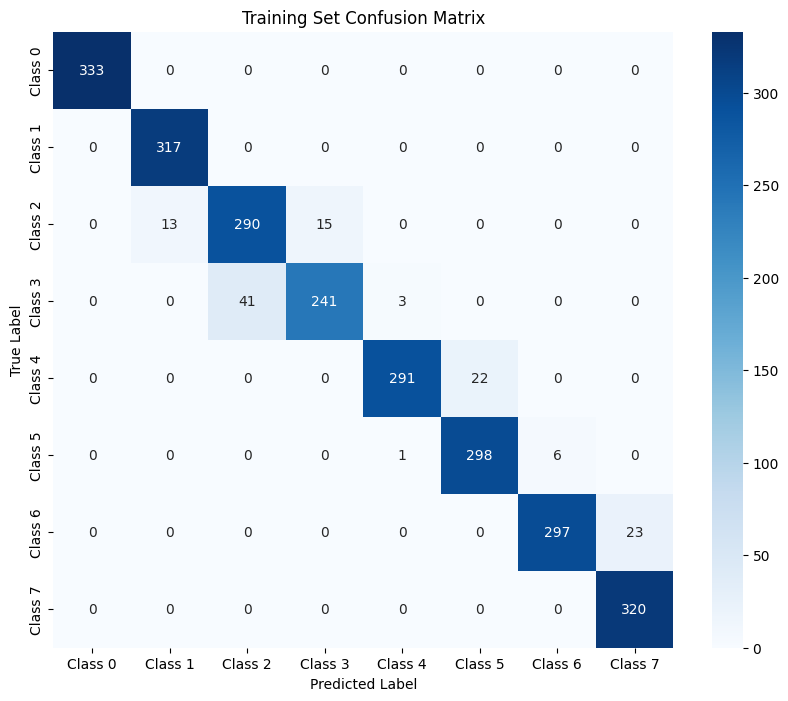

In [13]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Generate the confusion matrix for the training set
conf_matrix_train = confusion_matrix(all_true_labels_train, all_predicted_labels_train)

# Plot the confusion matrix for the training set
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", 
            xticklabels=[f'Class {i}' for i in range(8)], 
            yticklabels=[f'Class {i}' for i in range(8)])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Training Set Confusion Matrix')
plt.show()


### Test Set Evaluation

#### classification report

In [14]:
# Test set evaluation
vit_model.eval()
correct_test = 0
total_test = 0

# Initialize lists to store true and predicted labels
all_true_labels = []
all_predicted_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = vit_model(inputs)
        _, predicted_test = torch.max(outputs, 1)
        
        # Store true and predicted labels
        all_true_labels.extend(labels.cpu().numpy())
        all_predicted_labels.extend(predicted_test.cpu().numpy())
        
        total_test += labels.size(0)
        correct_test += (predicted_test == labels).sum().item()

test_accuracy = 100 * correct_test / total_test
print(f'Test Accuracy: {test_accuracy}%')

# Calculate precision, recall, and F1-score
report = classification_report(all_true_labels, all_predicted_labels, target_names=[f'Class {i}' for i in range(8)])
print(report)


Test Accuracy: 96.19047619047619%
              precision    recall  f1-score   support

     Class 0       1.00      1.00      1.00        33
     Class 1       1.00      1.00      1.00        48
     Class 2       0.78      1.00      0.88        32
     Class 3       1.00      0.80      0.89        44
     Class 4       1.00      0.95      0.97        38
     Class 5       0.96      1.00      0.98        46
     Class 6       1.00      0.97      0.98        32
     Class 7       0.98      1.00      0.99        42

    accuracy                           0.96       315
   macro avg       0.96      0.96      0.96       315
weighted avg       0.97      0.96      0.96       315



#### Confusion Matrix

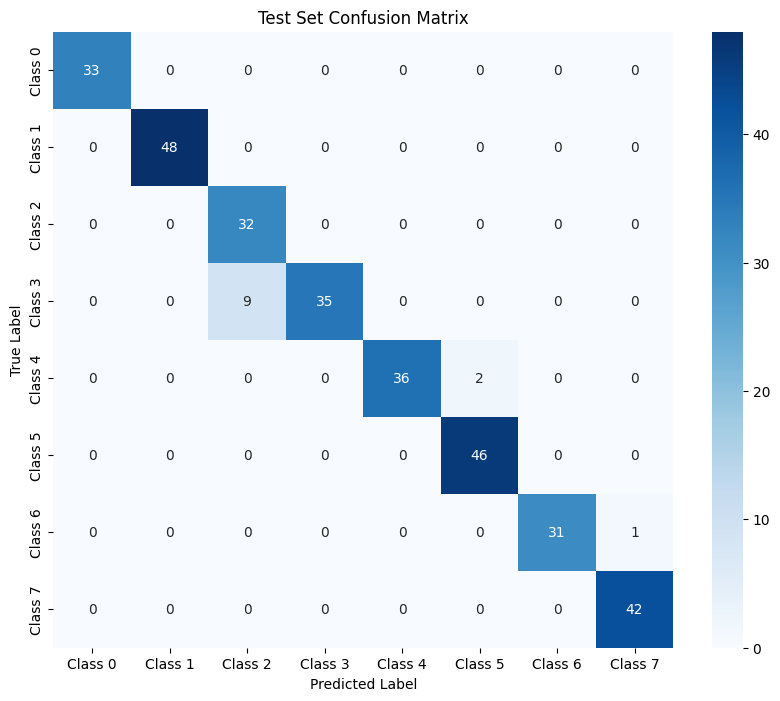

In [15]:
# Generate the confusion matrix
conf_matrix = confusion_matrix(all_true_labels, all_predicted_labels)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=[f'Class {i}' for i in range(8)], 
            yticklabels=[f'Class {i}' for i in range(8)])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Test Set Confusion Matrix')
plt.show()


#### Show Graph

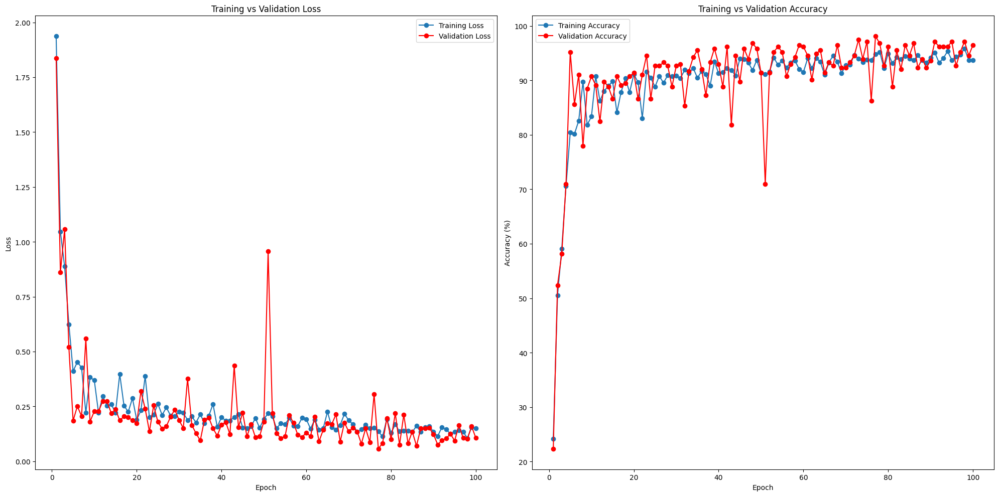

In [16]:

# Plotting Loss (Training vs Validation)
plt.figure(figsize=(20, 10))

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies, label='Training Accuracy', marker='o')
plt.plot(range(1, num_epochs + 1), val_accuracies, label='Validation Accuracy', marker='o', color='red')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

# Loss
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss', marker='o')
plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss', marker='o', color='red')
plt.title('Training vs Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


#### Save Model

In [ ]:
torch.save(vit_model.state_dict(), "vit_model_250_epoch.pth")